In [1]:
from dendrocat import RadioSource, MasterCatalog
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from regions import Regions, PixCoord
from astropy import stats
from itertools import chain
import dendrocat
from scipy import stats
import Paths.Paths as paths
from astropy.table import vstack, Table
Path = paths.filepaths()

/home/t.yoo/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
def add_skycoordinates(cat, wcs):
    """
    Add sky coordinates to the catalog based on WCS information.
    
    Parameters:
    cat : dict
        The catalog containing peak_x and peak_y pixel coordinates.
    wcs : astropy.wcs.WCS
        The WCS object for converting pixel coordinates to sky coordinates.
    
    Returns:
    None: The function modifies the input catalog in place.
    """
    xypix = np.column_stack((cat['peak_x'].data, cat['peak_y'].data))
    xysky = wcs.wcs_pix2world(xypix, 0)
    cat['peak_x_sky'] = xysky[:, 0]
    cat['peak_y_sky'] = xysky[:, 1]

    
    

def check_overlap(image_dir1, image_dir2, cat1, cat2):
    cats = [cat1, cat2]
    catnum1 = len(cat1['peak_x_sky'])
    catnum2 = len(cat2['peak_y_sky'])
    isinside1 = np.zeros(catnum1, dtype=bool)
    isinside2 = np.zeros(catnum2, dtype=bool)
    isinsides = [isinside1, isinside2]
    image_dirs = [image_dir1, image_dir2]
    catnums = [catnum1, catnum2]
    for i, image_dir in enumerate(image_dirs):
        fitsdata = fits.open(image_dir)
        wcs = WCS(fitsdata[0].header,naxis=2)
        image = fitsdata[0].data[0][0]
        if len(image.shape)>2:
            image = fitsdata[0].data[0][0]

        cat_comp = cats[i] ; cat = cats[i-1]

        xpeak = cat['peak_x_sky']
        ypeak = cat['peak_y_sky']

        xypeak = np.vstack((xpeak,ypeak)).T

        xypix = wcs.wcs_world2pix(xypeak,0)
        
        for j in range(catnums[i-1]):
            if xypix[j,0] < 0 or xypix[j,1] < 0 or xypix[j,0]>=image.shape[0] or xypix[j,1] >= image.shape[1]:
                isinsides[i-1][j] = False
            
            else:
                isinsides[i-1][j] = np.isfinite(image[int(xypix[j,0]),int(xypix[j,1])])
                
    return isinsides

def auto_matching(cat1, cat2, threshold=0.01, verbose=False):
    
    catnum1 = len(cat1['peak_x_sky'])
    matchingind = []            
    for i in range(catnum1):
        dist = np.sqrt((cat1['peak_x_sky'][i] - cat2['peak_x_sky'])**2
                      +(cat1['peak_y_sky'][i] - cat2['peak_y_sky'])**2)
        if verbose:
            print(i,cat1['_name'][i],cat2['_name'][np.argmin(dist)],np.min(dist),np.argmin(dist))
        if np.min(dist) < threshold:
            matchingind.append(np.argmin(dist))
        else:
            matchingind.append(-1)

        
    return np.array(matchingind)                       


def matching_main(b3cat, b6cat, b3fits, b6fits, threshold=7.588286987609E-06,label='w51e'):
    add_skycoordinates(b3cat, WCS(fits.open(b3fits)[0].header, naxis=2))
    add_skycoordinates(b6cat, WCS(fits.open(b6fits)[0].header, naxis=2))
    isinsides = check_overlap(b3fits, b6fits,b3cat, b6cat)
    b6_to_b3_ind = auto_matching(b3cat, b6cat, threshold=threshold, verbose=False)
    b3_to_b6_ind = auto_matching(b6cat, b3cat, threshold=threshold, verbose=False)   

    b3_ind_counterpart = np.where(b6_to_b3_ind>=0)
    b3_counterpart = b3cat[b3_ind_counterpart]
    b6_counterpart = b6cat[b6_to_b3_ind[b3_ind_counterpart]]
    
    raarr = []
    decarr = []

    for i in range(len(b3_counterpart)):
        if b6_counterpart['peak_x'][i] < 0 or b6_counterpart['peak_y'][i] < 0:
            raarr.append(b3_counterpart['peak_x'][i])
            decarr.append(b3_counterpart['peak_y'][i])
        else:
            raarr.append(b6_counterpart['peak_x_sky'][i])
            decarr.append(b6_counterpart['peak_y_sky'][i])

    table_matched = Table([b3_counterpart['_name'], b6_counterpart['_name'], 
                        b3_counterpart['peak_x'], b3_counterpart['peak_y'],
                        b6_counterpart['peak_x'], b6_counterpart['peak_y'],
                        b3_counterpart['peak_x_sky'], b3_counterpart['peak_y_sky'],
                        b6_counterpart['peak_x_sky'], b6_counterpart['peak_y_sky'],
                        np.array(raarr), np.array(decarr),
                        b3_counterpart['major_fwhm'], b3_counterpart['minor_fwhm'], b3_counterpart['position_angle'],
                        b6_counterpart['major_fwhm'], b6_counterpart['minor_fwhm'], b6_counterpart['position_angle'],
                        np.ones(len(b3_ind_counterpart[0]), dtype=bool), isinsides[0][b3_ind_counterpart]],
                    names=('b3_id','b6_id','b3_xpix','b3_ypix','b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky','b6_xsky','b6_ysky', 
                            'ra', 'dec',
                            'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                    )
    print(len(table_matched))                    
    b3_ind_nomatch = np.where(b6_to_b3_ind<0)
    b3only = b3cat[b3_ind_nomatch]
    b3only_num = len(b3_ind_nomatch[0])
    dummyarr = np.ones(b3only_num)*(-1)
    dummyarr_str = np.zeros(b3only_num, dtype=str)
  
    table_b3only = Table([b3only['_name'], dummyarr_str,
                        b3only['peak_x'], b3only['peak_y'],
                        dummyarr, dummyarr,
                        b3only['peak_x_sky'], b3only['peak_y_sky'],
                        dummyarr, dummyarr,
                        b3only['peak_x_sky'], b3only['peak_y_sky'],
                        b3only['major_fwhm'], b3only['minor_fwhm'], b3only['position_angle'],
                        dummyarr, dummyarr, dummyarr,
                        np.zeros(b3only_num, dtype=bool), isinsides[0][b3_ind_nomatch]],
                        names=('b3_id','b6_id',
                            'b3_xpix','b3_ypix',
                            'b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky',
                            'b6_xsky','b6_ysky',
                            'ra', 'dec',
                            'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                        )

    print(len(table_b3only))                    
                        
    b6_ind_nomatch = np.where(b3_to_b6_ind<0)
    b6only = b6cat[b6_ind_nomatch]
    b6only_num = len(b6_ind_nomatch[0])
    dummyarr = np.ones(b6only_num)*(-1)
    dummyarr_str = np.zeros(b6only_num, dtype=str)
    table_b6only = Table([dummyarr_str, b6only['_name'], 
                        dummyarr, dummyarr,
                        b6only['peak_x'], b6only['peak_y'],
                        dummyarr, dummyarr,
                        b6only['peak_x_sky'], b6only['peak_y_sky'],
                        b6only['peak_x_sky'], b6only['peak_y_sky'],
                        dummyarr, dummyarr, dummyarr,
                        b6only['major_fwhm'], b6only['minor_fwhm'], b6only['position_angle'],
                        np.zeros(b6only_num, dtype=bool), isinsides[1][b6_ind_nomatch]],
                        names=('b3_id','b6_id',
                        'b3_xpix','b3_ypix',
                        'b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky',
                            'b6_xsky','b6_ysky',
                            'ra', 'dec',
                            'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                        )
    print(len(table_b6only))                    

    table_fin = vstack([table_matched, table_b3only, table_b6only])
    sortind = np.lexsort((table_fin['b6_id'],~table_fin['is_matched'],~table_fin['is_overlap']))
    table_fin = table_fin[sortind]








    table_fin.write(f'tables/dendro_{label}_matched.fits', format='fits', overwrite=True)

    print(len(table_fin))        

def plot_matched_catalog(matched_cat, fitsfile, label='w51e'):
    table_fin = Table.read(matched_cat)

 
    w51e_ra = []
    w51e_dec = []
    b3only = []
    b6only = []
    both = []
    for i in range(len(table_fin)): 
        if table_fin['b6_xsky'][i] < 0:
            w51e_ra.append(table_fin['b3_xsky'][i])
            w51e_dec.append(table_fin['b3_ysky'][i])
            b3only.append(i)
        else:
            w51e_ra.append(table_fin['b6_xsky'][i])
            w51e_dec.append(table_fin['b6_ysky'][i])
            if table_fin['b3_xsky'][i] < 0:
                b6only.append(i)
            else:
                both.append(i)

  
    fig = plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111)
    w51e_b3_fitsdata = fits.open(fitsfile)
    w51e_b3_image = w51e_b3_fitsdata[0].data
    ax.imshow(w51e_b3_image[0][0], origin='lower', cmap=plt.get_cmap('inferno'),vmin=-0.000311680, vmax=0.001241484998551493)
    wcs_w51e_b3 = WCS(w51e_b3_fitsdata[0].header,naxis=2)
    pixxy = wcs_w51e_b3.wcs_world2pix(np.array(w51e_ra), np.array(w51e_dec), 0)
    
    ax.scatter(np.array(pixxy[0])[both], np.array(pixxy[1])[both], marker='o', facecolor='none',edgecolor='cyan', s=100, label='both')
    ax.scatter(np.array(pixxy[0])[b3only], np.array(pixxy[1])[b3only], marker='o', facecolor='none',edgecolor='magenta', s=100, label='B3 only')
    ax.scatter(np.array(pixxy[0])[b6only], np.array(pixxy[1])[b6only], marker='o', facecolor='none',edgecolor='orange', s=100, label='B6 only')
    ax.legend(fontsize=40)
    plt.savefig(f'pngs/matched_{label}.png')    
            
    

In [3]:
w51e_B3_catalog = 'tables/W51-E_B3_truncated_dendro.fits'
w51e_B6_catalog = 'tables/W51-E_B6_truncated_dendro.fits'
w51n_B3_catalog = 'tables/W51-IRS2_B3_truncated_dendro.fits'
w51n_B6_catalog = 'tables/W51-IRS2_B6_truncated_dendro.fits'


from astropy.table import Table
w51e_b3_cat = Table.read(w51e_B3_catalog)
w51e_b6_cat = Table.read(w51e_B6_catalog)
w51n_b3_cat = Table.read(w51n_B3_catalog)
w51n_b6_cat = Table.read(w51n_B6_catalog)



In [4]:
matching_main(w51e_b3_cat, w51e_b6_cat, Path.w51e_b3_tt0, Path.w51e_b6_tt0, threshold=2e-5, label='w51e')
matching_main(w51n_b3_cat, w51n_b6_cat, Path.w51n_b3_tt0, Path.w51n_b6_tt0, threshold=2e-5, label='w51n')



73
36
22
131


23
59
11
93


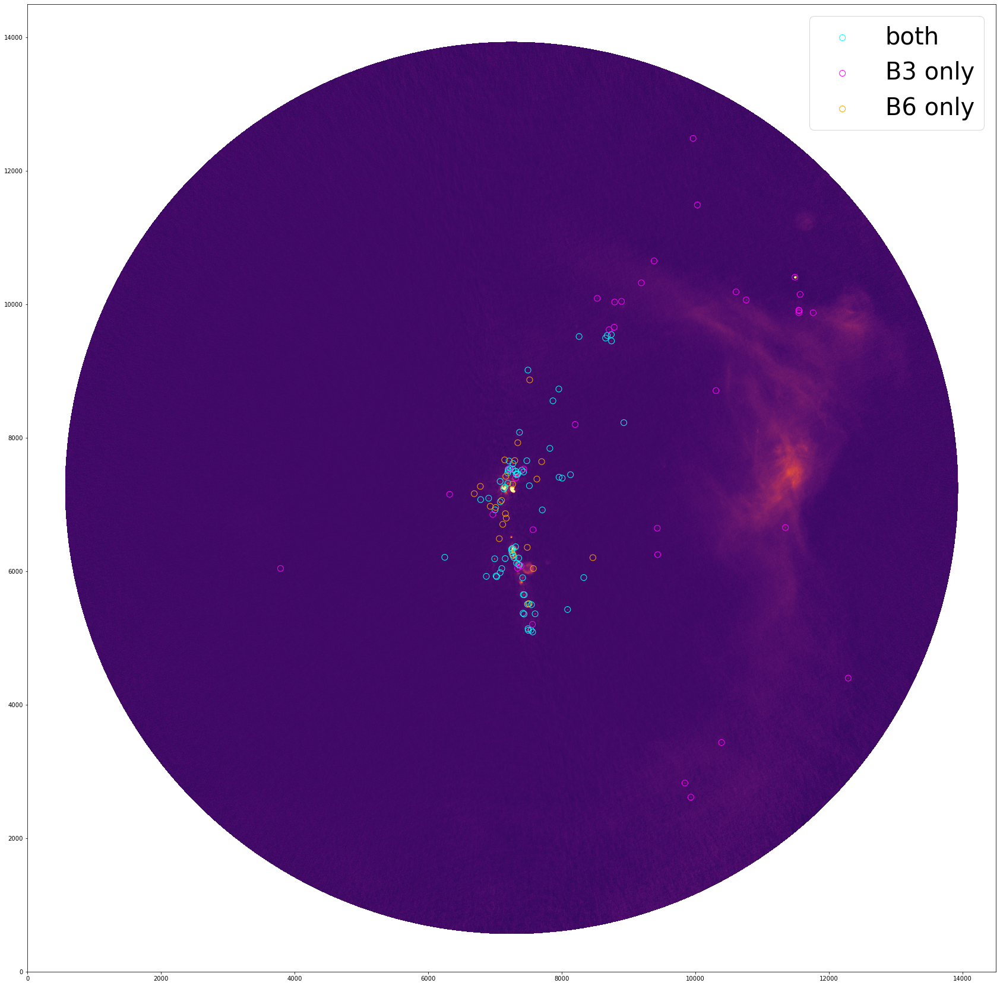

In [5]:
plot_matched_catalog('tables/dendro_w51e_matched.fits', Path.w51e_b3_tt0, label='w51e')


###Making combined catalog

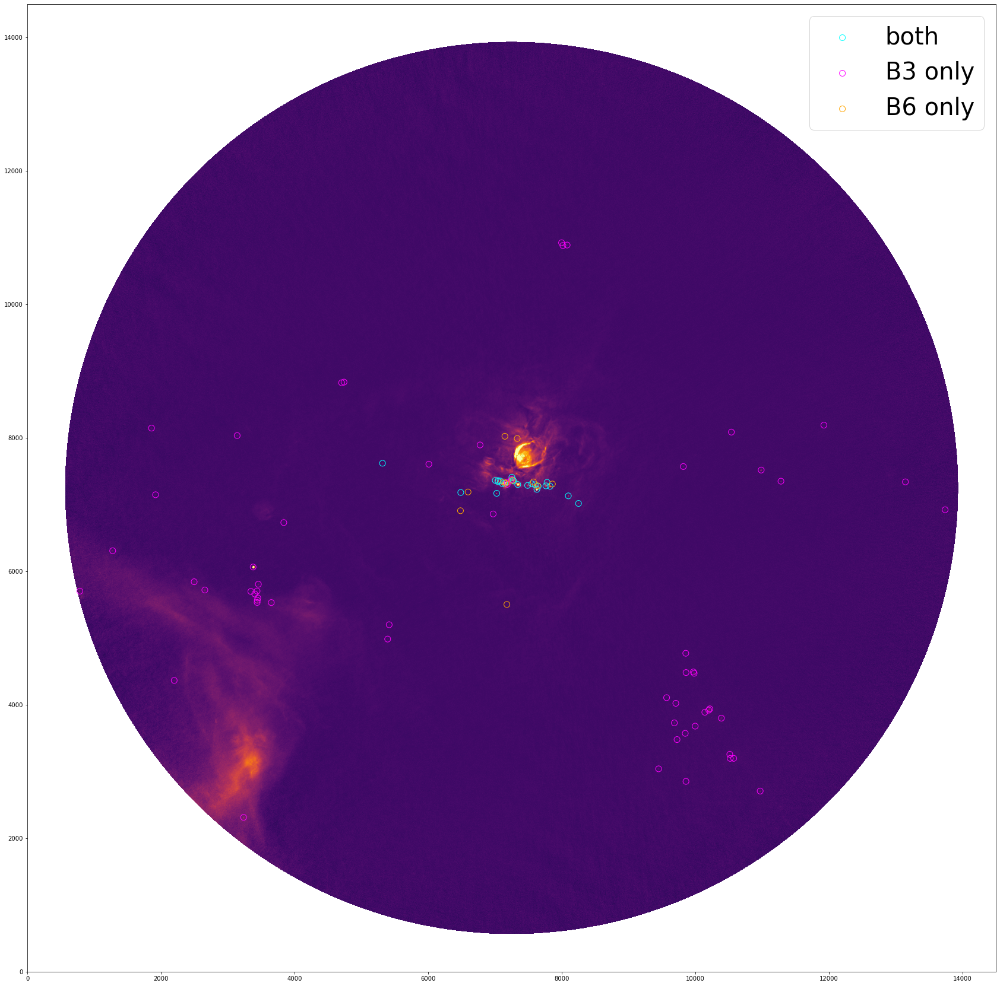

In [6]:

plot_matched_catalog('tables/dendro_w51n_matched.fits', Path.w51n_b3_tt0, label='w51n')


In [7]:
def check_new_sources(old_cat, new_cat, fitsfile, label='w51e'):
    fig = plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111)
    w51e_b3_fitsdata = fits.open(fitsfile)
    w51e_b3_image = w51e_b3_fitsdata[0].data
    ax.imshow(w51e_b3_image[0][0], origin='lower', cmap=plt.get_cmap('inferno'),vmin=-0.000311680, vmax=0.001241484998551493)   
    
    new_catalog = Table.read(new_cat)
    old_catalog = Table.read(old_cat)
    
    new_cat_ra = []
    new_cat_dec = []
    for i in range(len(new_catalog)): 
        if new_catalog['b6_xsky'][i] < 0:
            new_cat_ra.append(new_catalog['b3_xsky'][i])
            new_cat_dec.append(new_catalog['b3_ysky'][i])
        else:
            new_cat_ra.append(new_catalog['b6_xsky'][i])
            new_cat_dec.append(new_catalog['b6_ysky'][i])

    wcs_w51e_b3 = WCS(w51e_b3_fitsdata[0].header,naxis=2)
    pixxy_newcat = wcs_w51e_b3.wcs_world2pix(np.array(new_cat_ra), np.array(new_cat_dec), 0)
    old_cat_ra = []
    old_cat_dec = []
    for i in range(len(old_catalog)):
        if old_catalog['b6_xsky'][i] < 0:
            old_cat_ra.append(old_catalog['b3_xsky'][i])
            old_cat_dec.append(old_catalog['b3_ysky'][i])
        else:
            old_cat_ra.append(old_catalog['b6_xsky'][i])
            old_cat_dec.append(old_catalog['b6_ysky'][i])
    pixxy_oldcat = wcs_w51e_b3.wcs_world2pix(np.array(old_cat_ra), np.array(old_cat_dec), 0)
    print(pixxy_oldcat)
    ax.scatter(np.array(pixxy_newcat[0]), np.array(pixxy_newcat[1]), marker='o', facecolor='none',edgecolor='cyan', s=30, label='new sources')
    ax.scatter(np.array(pixxy_oldcat[0]), np.array(pixxy_oldcat[1]), marker='o', facecolor='none',edgecolor='magenta', s=50, label='old sources')
    ax.legend(fontsize=40)
    ax.set_xlim(0, w51e_b3_image[0][0].shape[0])
    ax.set_ylim(0, w51e_b3_image[0][0].shape[1])
    ax.set_xlabel('RA (pixel)', fontsize=40)
    ax.set_ylabel('Dec (pixel)', fontsize=40)
    plt.savefig(f'pngs/new_source_check_{label}.png')

[array([ 7.56542862e+03,  8.93060212e+03,  7.50028576e+03,  7.54200005e+03,
        7.49571434e+03,  7.60142862e+03,  7.43628576e+03,  7.42200005e+03,
        8.08771434e+03,  7.54714291e+03,  7.48714291e+03,  7.51342862e+03,
        7.43971434e+03,  7.42485719e+03,  7.41514291e+03,  8.33057148e+03,
        7.02714291e+03,  6.87171434e+03,  7.01742862e+03,  7.36371434e+03,
        7.10314291e+03,  7.34028576e+03,  7.38828576e+03,  6.99000005e+03,
        7.36714291e+03,  7.35400005e+03,  7.32428576e+03,  6.99628576e+03,
        7.35685719e+03,  7.28428576e+03,  7.27171434e+03,  7.25685719e+03,
        7.29000005e+03,  7.25171434e+03,  7.25057148e+03,  7.26257148e+03,
        7.31000005e+03,  7.70942862e+03,  7.00257148e+03,  7.07914291e+03,
        6.78657148e+03,  6.90657148e+03,  7.13342862e+03,  7.23857148e+03,
        7.51571434e+03,  7.19342862e+03,  7.07800005e+03,  8.00771434e+03,
        7.30714291e+03,  7.96028576e+03,  7.31800005e+03,  8.13171434e+03,
        7.33742862e+03, 

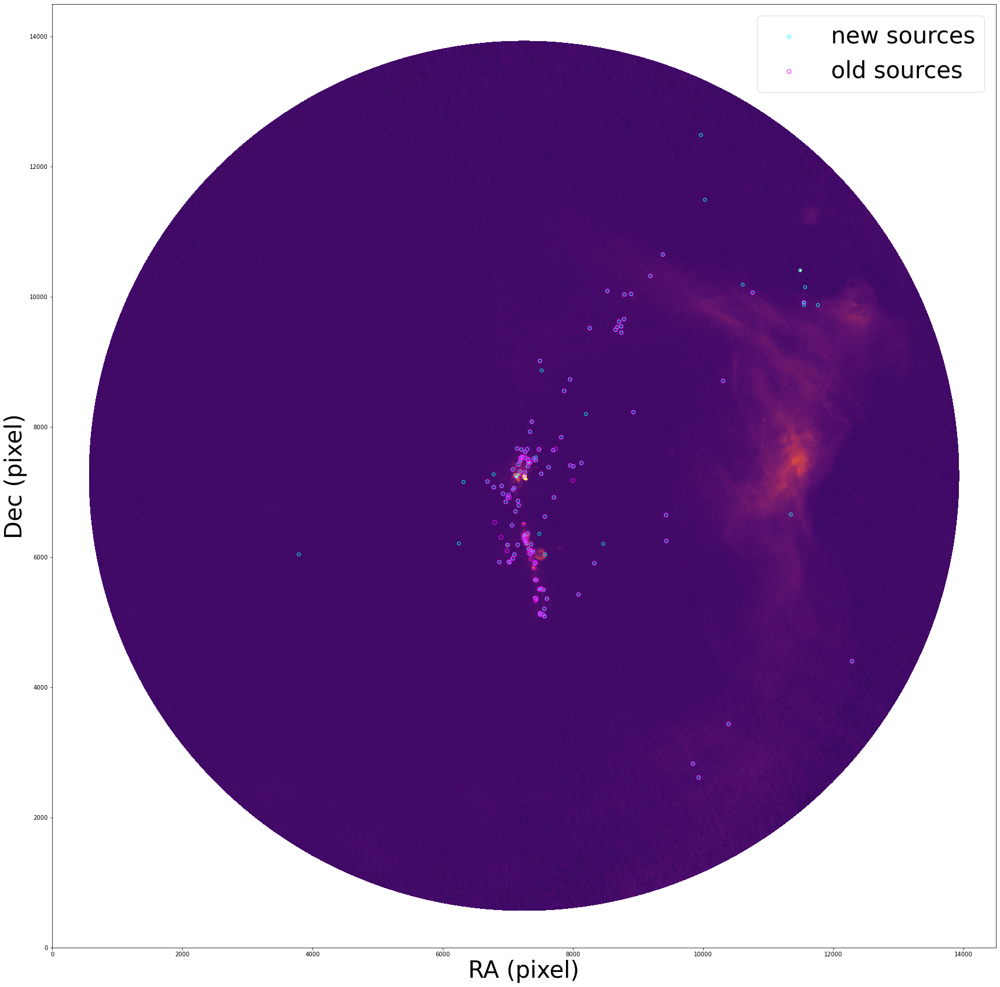

In [8]:
check_new_sources(Path.w51e_dendro_matched_catalog_old, 'tables/dendro_w51e_matched.fits', Path.w51e_b3_tt0, label='w51e')


[array([ 8251.99244447,  8099.42111902,  7026.8497253 ,  7629.13549426,
        7825.70696451,  7489.70697596,  7603.42127054,  7648.5641079 ,
        7763.42125546,  7341.70698847,  7145.13557761,  7181.13556249,
        7551.99271162,  7113.1355703 ,  7781.70701871,  7082.27846496,
        7046.27845661,  7046.84989976,  7006.27847329,  7271.42133563,
        7253.70708794,  5416.99999999,  6973.99999998,  7650.00000001,
        7183.00000001,  9821.00000001,  6011.00000001,  5317.99999999,
        6488.56402248,  7638.27839935,  7279.42132209,  7260.5641886 ,
        3236.99999998, 10972.00000001, 10963.        ,  9450.99999999,
       10523.00000001, 10575.99999999, 10516.99999999,  9726.99999999,
        9999.        ,  9687.        , 10391.        , 10143.        ,
       10202.        , 10218.        ,  9709.        ,  9571.        ,
        9983.00000002,  9972.00000001,  9858.        ,  5393.99999999,
        3652.        ,  3439.99999999,  3450.00000001,  3404.00000001,
     

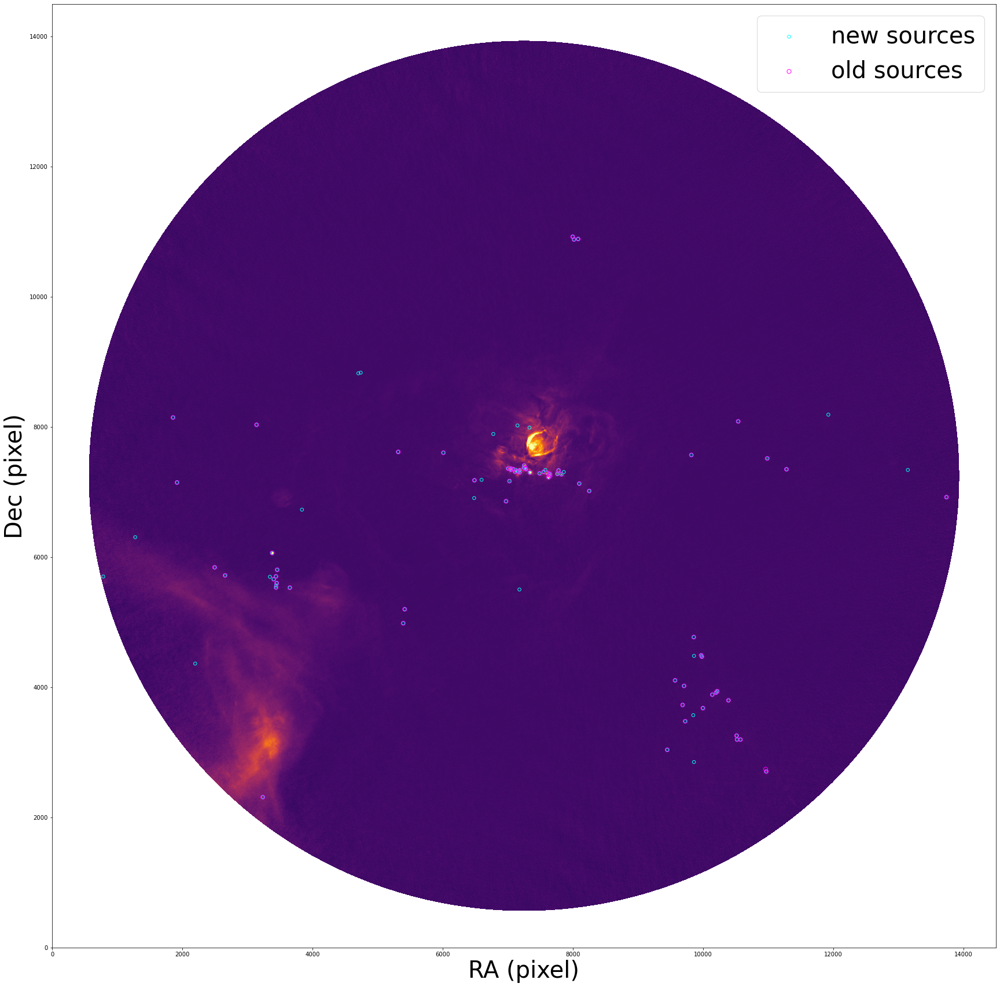

In [9]:
check_new_sources(Path.w51n_dendro_matched_catalog_old, 'tables/dendro_w51n_matched.fits', Path.w51n_b3_tt0, label='w51n')

In [10]:
w51e_matched_tab = Table.read('tables/dendro_w51e_matched.fits')
w51e_matched_tab.pprint(max_width=-1, max_lines=-1)

 b3_id     b6_id   b3_xpix b3_ypix b6_xpix b6_ypix      b3_xsky            b3_ysky            b6_xsky            b6_ysky               ra                dec                b3_afwhm               b3_bfwhm               b3_pa               b6_afwhm               b6_bfwhm               b6_pa        is_matched is_overlap
                                                                                                                                                                              deg                    deg                   deg                  deg                    deg                   deg                              
-------- --------- ------- ------- ------- ------- ------------------ ------------------ ------------------ ------------------ ------------------ ------------------ ---------------------- ---------------------- ------------------- ---------------------- ---------------------- ------------------- ---------- ----------
93030993 226003756  7566.0  5089.0  7802.0 